<a href="https://colab.research.google.com/github/quickgrid/AI-Resources/blob/master/code-lab/computer_vision/Mediapipe_Python_Holistic_and_Face_Mesh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget 'https://upload.wikimedia.org/wikipedia/commons/thumb/2/22/Yann_LeCun_-_2018_%28cropped%29.jpg/800px-Yann_LeCun_-_2018_%28cropped%29.jpg' -O 'img.jpg'

--2021-11-16 03:42:27--  https://upload.wikimedia.org/wikipedia/commons/thumb/2/22/Yann_LeCun_-_2018_%28cropped%29.jpg/800px-Yann_LeCun_-_2018_%28cropped%29.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167047 (163K) [image/jpeg]
Saving to: ‘img.jpg’

img.jpg             100%[===================>] 163.13K  --.-KB/s    in 0.04s   

2021-11-16 03:42:27 (4.20 MB/s) - ‘img.jpg’ saved [167047/167047]



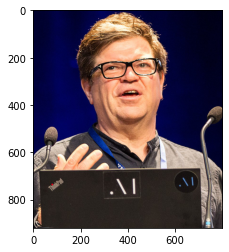

In [2]:
import matplotlib.pyplot as plt
from PIL import Image

im = Image.open('img.jpg')
plt.imshow(im)

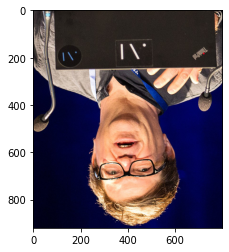

In [3]:
im2 = im.rotate(180)
plt.imshow(im2)
im2.save('img2.jpg')

In [4]:
!pip install mediapipe

     |████████████████████████████████| 32.8 MB 52 kB/s 


In [5]:
from google.colab.patches import cv2_imshow

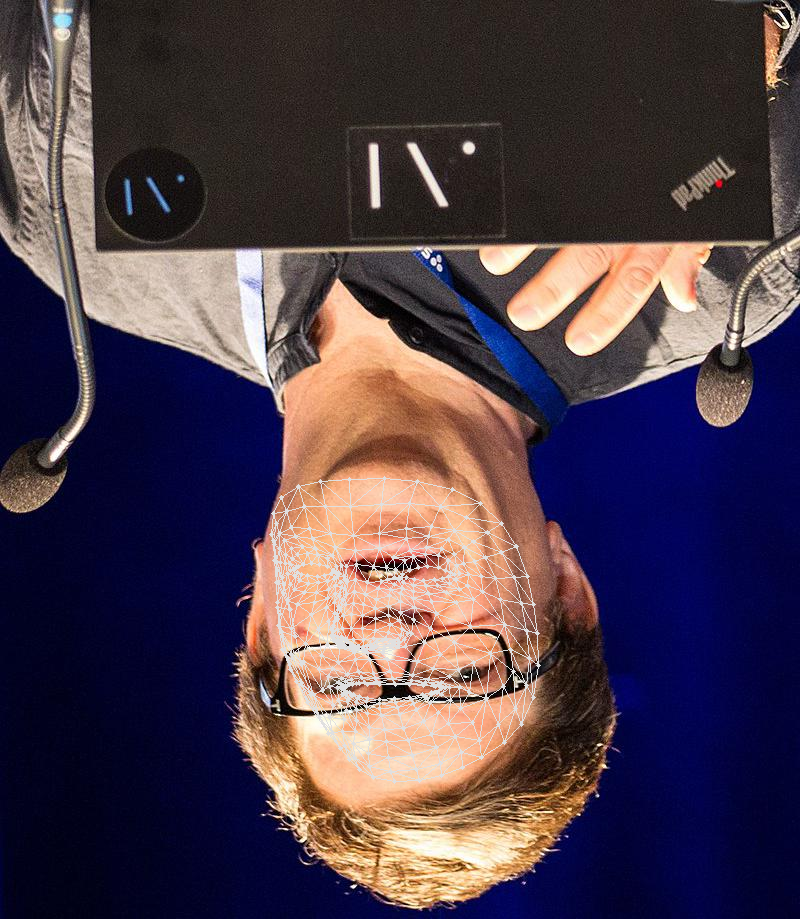

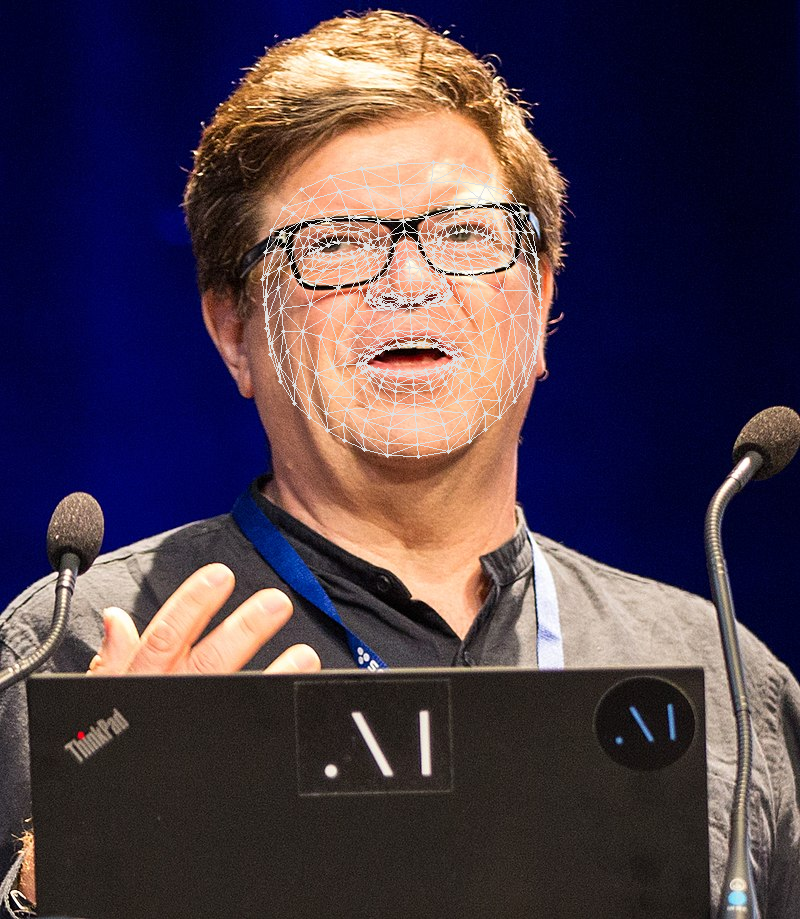

In [8]:
import cv2
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_face_mesh = mp.solutions.face_mesh

import glob
file_list = glob.glob('*.jpg')

# For static images:
drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    min_detection_confidence=0.5) as face_mesh:
  for idx, file in enumerate(file_list):
    image = cv2.imread(file)
    # Convert the BGR image to RGB before processing.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print and draw face mesh landmarks on the image.
    if not results.multi_face_landmarks:
      continue
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      #print('face_landmarks:', face_landmarks)
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION, # FACEMESH_CONTOURS
          landmark_drawing_spec=drawing_spec,
          connection_drawing_spec=drawing_spec)
    #cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', annotated_image)

    cv2_imshow(annotated_image)

Nose coordinates: (383.34267139434814, 614.2038825750351)


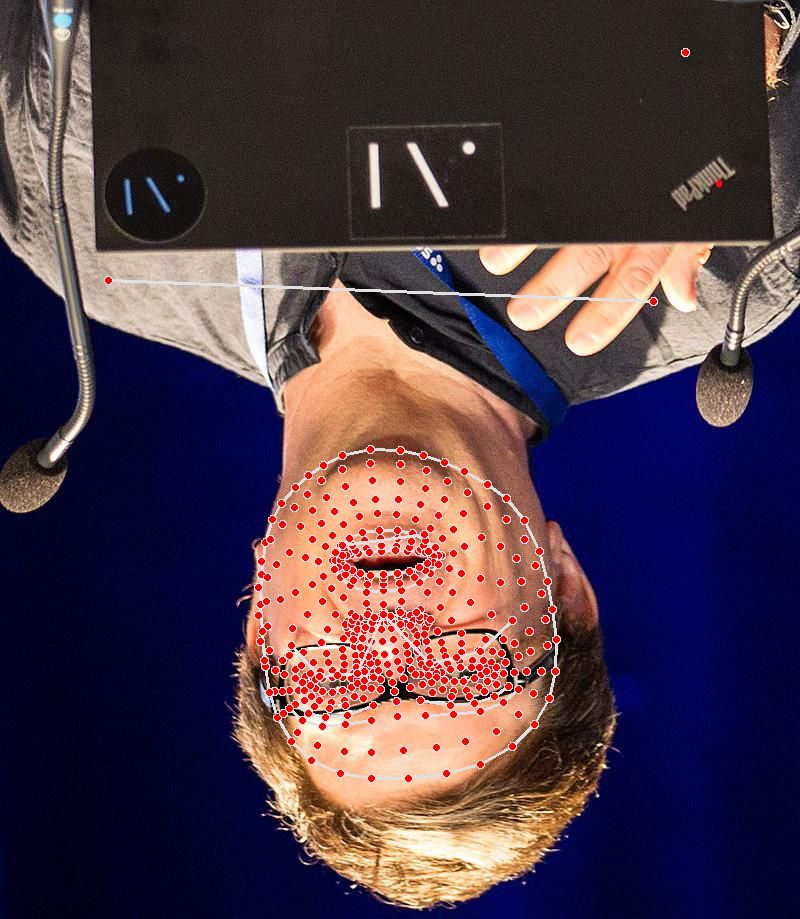

Nose coordinates: (420.1568603515625, 302.50053679943085)


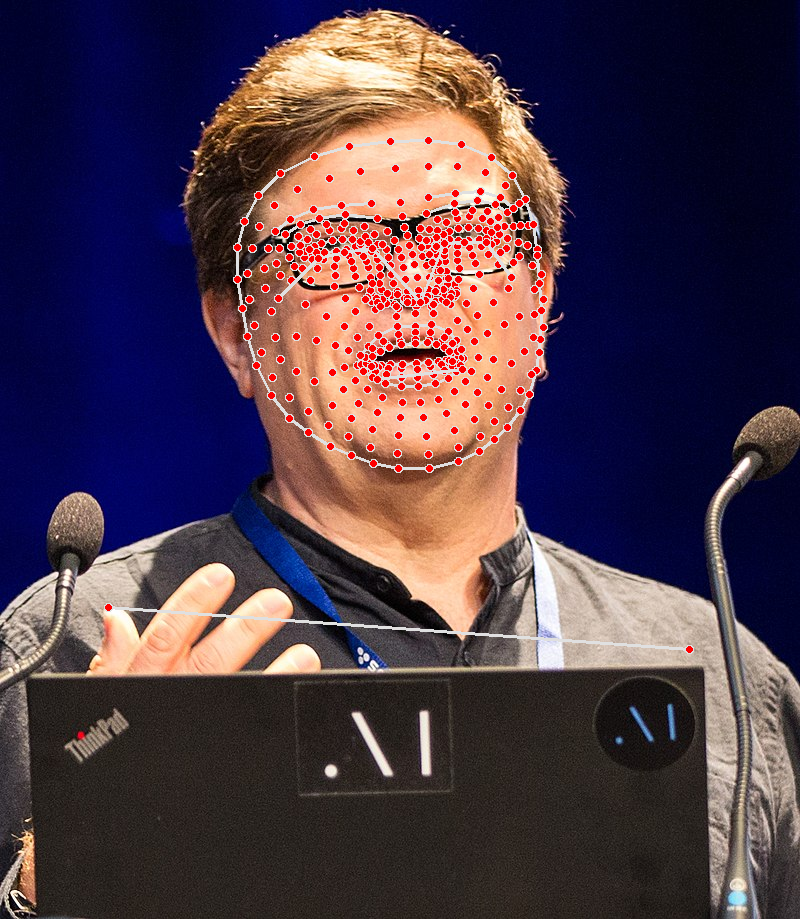

In [10]:
import cv2
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_holistic = mp.solutions.holistic

import glob
file_list = glob.glob('*.jpg')

# For static images:
with mp_holistic.Holistic(static_image_mode=True) as holistic:
  for idx, file in enumerate(file_list):
    image = cv2.imread(file)
    image_height, image_width, _ = image.shape
    # Convert the BGR image to RGB before processing.
    results = holistic.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    if results.pose_landmarks:
      print(
          f'Nose coordinates: ('
          f'{results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].x * image_width}, '
          f'{results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].y * image_height})'
      )
    # Draw pose, left and right hands, and face landmarks on the image.
    annotated_image = image.copy()
    mp_drawing.draw_landmarks(
        annotated_image, results.face_landmarks, mp_holistic.FACEMESH_CONTOURS)
    mp_drawing.draw_landmarks(
        annotated_image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS)
    mp_drawing.draw_landmarks(
        annotated_image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS)
    # Use mp_holistic.UPPER_BODY_POSE_CONNECTIONS for drawing below when
    # upper_body_only is set to True.
    mp_drawing.draw_landmarks(
        annotated_image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS)
    #cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', annotated_image)

    cv2_imshow(annotated_image)
    

landmark {
  x: 0.5251960754394531
  y: 0.32916271686553955
  z: -1.7081482410430908
  visibility: 0.999968409538269
}
landmark {
  x: 0.556029736995697
  y: 0.2644672393798828
  z: -1.5959198474884033
  visibility: 0.9999364614486694
}
landmark {
  x: 0.5802538990974426
  y: 0.26386380195617676
  z: -1.5958667993545532
  visibility: 0.9999316930770874
}
landmark {
  x: 0.6078135967254639
  y: 0.2639085054397583
  z: -1.5965038537979126
  visibility: 0.9999278783798218
}
landmark {
  x: 0.46535900235176086
  y: 0.2705646753311157
  z: -1.5995904207229614
  visibility: 0.9999487400054932
}
landmark {
  x: 0.4301963746547699
  y: 0.27524495124816895
  z: -1.5982569456100464
  visibility: 0.9999518394470215
}
landmark {
  x: 0.3976292312145233
  y: 0.28117313981056213
  z: -1.5987260341644287
  visibility: 0.9999568462371826
}
landmark {
  x: 0.639164388179779
  y: 0.30237245559692383
  z: -0.8470227718353271
  visibility: 0.9999078512191772
}
landmark {
  x: 0.34855541586875916
  y: 0.32

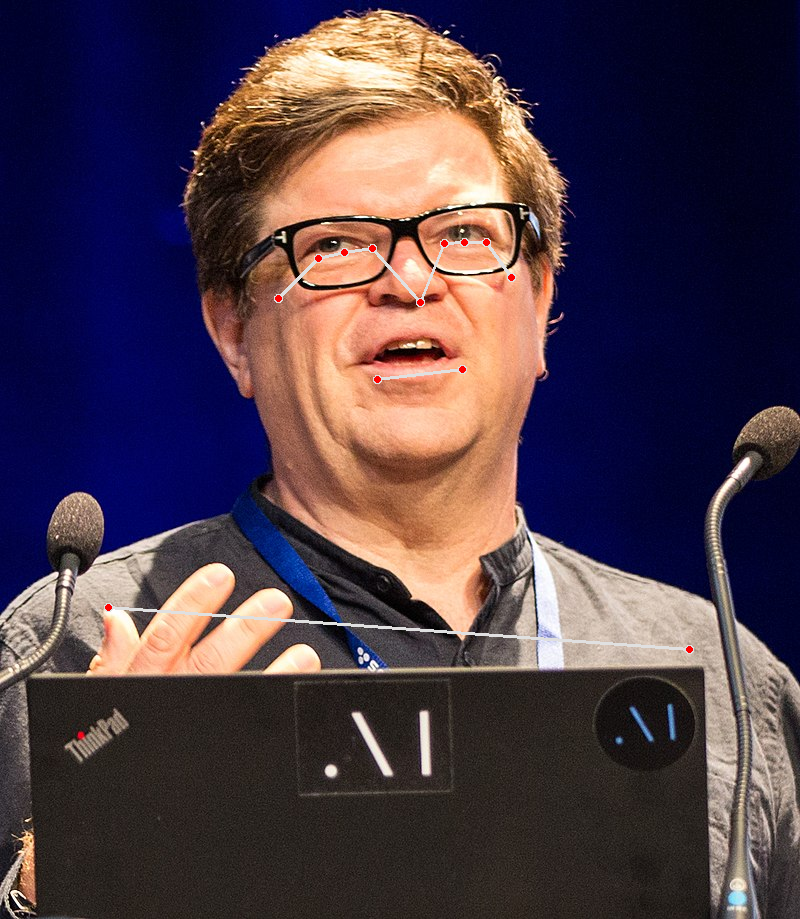

In [16]:
import cv2
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_holistic = mp.solutions.holistic

import glob
file_list = glob.glob('img.jpg')

# For static images:
with mp_holistic.Holistic(static_image_mode=True) as holistic:
  for idx, file in enumerate(file_list):
    image = cv2.imread(file)
    image_height, image_width, _ = image.shape
    # Convert the BGR image to RGB before processing.
    results = holistic.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    print('=' * 40)
    print(results.pose_landmarks)

    if results.pose_landmarks:
      print(
          f'Nose coordinates: ('
          f'{results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].x * image_width}, '
          f'{results.pose_landmarks.landmark[mp_holistic.PoseLandmark.NOSE].y * image_height})'
      )
    # Draw pose, left and right hands, and face landmarks on the image.
    annotated_image = image.copy()



    # mp_drawing.draw_landmarks(
    #     annotated_image, results.face_landmarks, mp_holistic.FACEMESH_CONTOURS)
    # mp_drawing.draw_landmarks(
    #     annotated_image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS)
    # mp_drawing.draw_landmarks(
    #     annotated_image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS)
    # # Use mp_holistic.UPPER_BODY_POSE_CONNECTIONS for drawing below when
    # # upper_body_only is set to True.
    mp_drawing.draw_landmarks(
        annotated_image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS)
    # #cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', annotated_image)

    cv2_imshow(annotated_image)
    

face_landmarks: landmark {
  x: 0.5163443088531494
  y: 0.35776087641716003
  z: -0.06280934810638428
}
landmark {
  x: 0.5131545662879944
  y: 0.3150114417076111
  z: -0.08897154778242111
}
landmark {
  x: 0.5118218660354614
  y: 0.3314254581928253
  z: -0.054927386343479156
}
landmark {
  x: 0.4946916699409485
  y: 0.2821235954761505
  z: -0.05663089081645012
}
landmark {
  x: 0.5120571851730347
  y: 0.3028247356414795
  z: -0.09097851812839508
}
landmark {
  x: 0.5098179578781128
  y: 0.2894645929336548
  z: -0.0802493765950203
}
landmark {
  x: 0.5037341713905334
  y: 0.26000648736953735
  z: -0.025433339178562164
}
landmark {
  x: 0.3962743580341339
  y: 0.27156636118888855
  z: 0.03522523492574692
}
landmark {
  x: 0.5004688501358032
  y: 0.24004118144512177
  z: -0.006274874787777662
}
landmark {
  x: 0.49877864122390747
  y: 0.2261222004890442
  z: -0.0032566068693995476
}
landmark {
  x: 0.4916621446609497
  y: 0.17391027510166168
  z: 0.035713210701942444
}
landmark {
  x: 0.

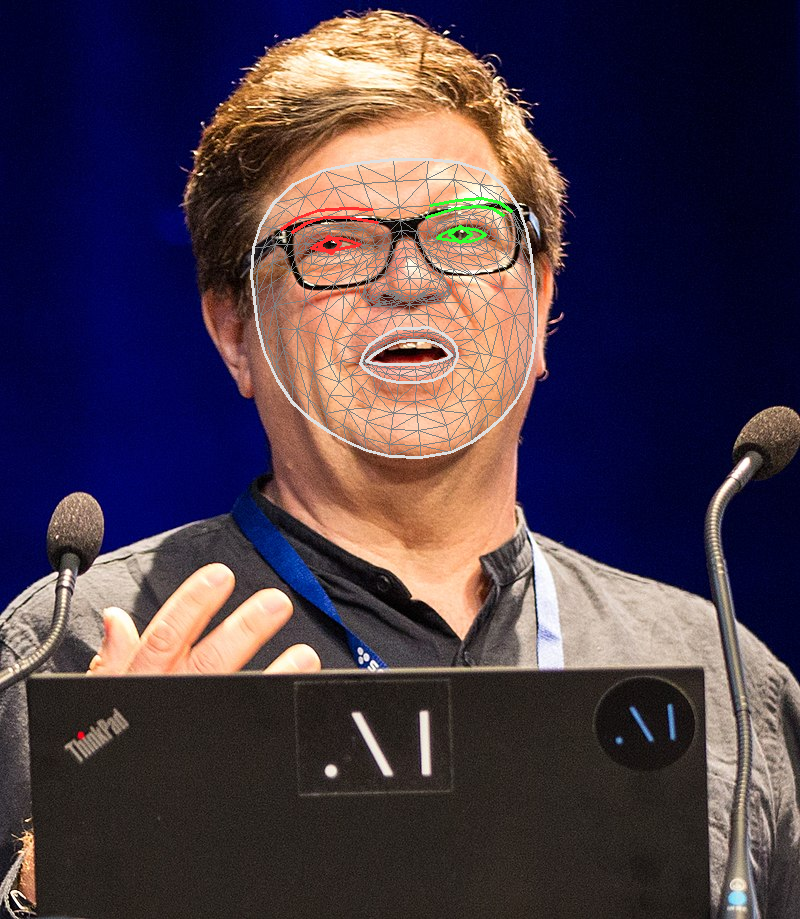

In [21]:
import cv2
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_face_mesh = mp.solutions.face_mesh

# For static images:

import glob
IMAGE_FILES = glob.glob('img.jpg')


drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5) as face_mesh:
  for idx, file in enumerate(IMAGE_FILES):
    image = cv2.imread(file)
    # Convert the BGR image to RGB before processing.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print and draw face mesh landmarks on the image.
    if not results.multi_face_landmarks:
      continue
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      print('face_landmarks:', face_landmarks)
      
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_tesselation_style())
      
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_CONTOURS,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_contours_style())
      
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_IRISES,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_iris_connections_style())
      
    # cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', annotated_image)
    cv2_imshow(annotated_image)

478
311 248
317 249
322 250
329 250
339 249
346 247
353 246
358 245
360 244
356 243
349 240
340 238
332 238
324 241
318 243
314 246


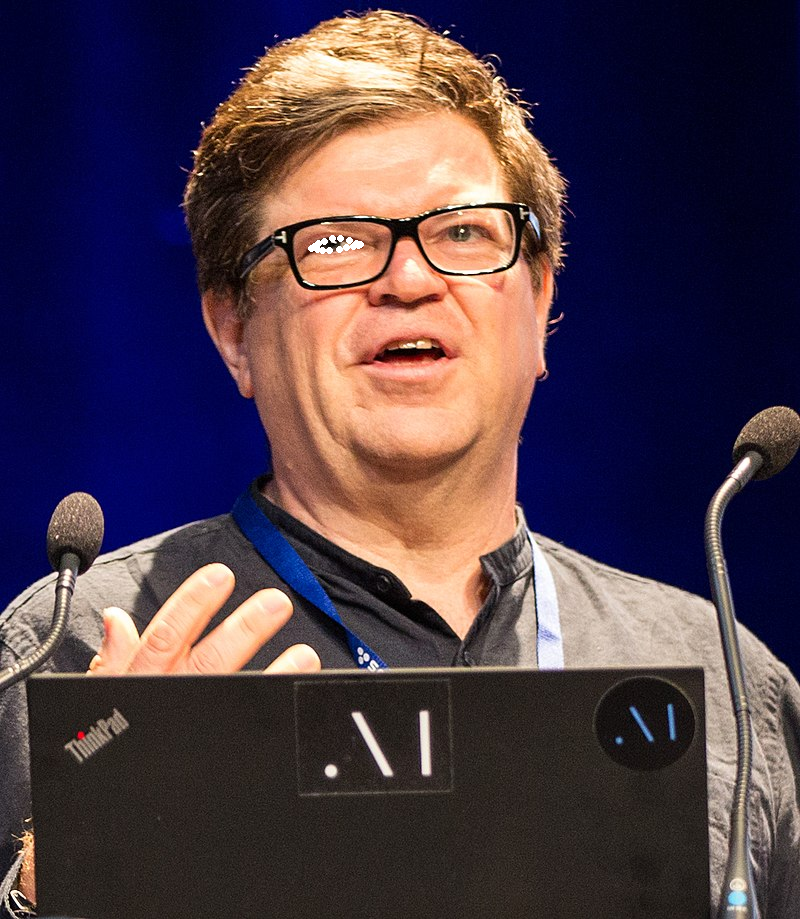

In [55]:
import cv2
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_face_mesh = mp.solutions.face_mesh

# For static images:

import glob
IMAGE_FILES = glob.glob('img.jpg')


drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5) as face_mesh:
  for idx, file in enumerate(IMAGE_FILES):
    image = cv2.imread(file)
    # Convert the BGR image to RGB before processing.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print and draw face mesh landmarks on the image.
    if not results.multi_face_landmarks:
      continue
    annotated_image = image.copy()

    landmarks_list = [33, 7, 163, 144, 145, 153, 154, 155, 133, 173, 157, 158, 159, 160, 161, 246]

    for face_landmarks in results.multi_face_landmarks:
      #print('face_landmarks:', face_landmarks)

      print(len(face_landmarks.landmark))
    #   print(face_landmarks.landmark[7])

      for idx in landmarks_list:
        loc_x, loc_y = int(face_landmarks.landmark[idx].x * image.shape[1]), int(face_landmarks.landmark[idx].y * image.shape[0])
        print(loc_x, loc_y)
        cv2.circle(annotated_image,(loc_x, loc_y), 2, (255,255,255), 2)


    #   for idx in range(len(face_landmarks.landmark)):
    #     if idx > 10:
    #         break
    #     loc_x, loc_y = int(face_landmarks.landmark[idx].x * image.shape[1]), int(face_landmarks.landmark[idx].y * image.shape[0])
    #     print(loc_x, loc_y)
    #     cv2.circle(annotated_image,(loc_x, loc_y), 5, (255,255,255), 3)

    #   loc_x, loc_y = int(face_landmarks.landmark[7].x * image.shape[1]), int(face_landmarks.landmark[7].y * image.shape[0])
    #   print(loc_x, loc_y)
    #   cv2.circle(annotated_image,(loc_x, loc_y), 3, (255,255,255), 2)
    #   loc_x, loc_y = int(face_landmarks.landmark[33].x * image.shape[1]), int(face_landmarks.landmark[33].y * image.shape[0])
    #   print(loc_x, loc_y)
    #   cv2.circle(annotated_image,(loc_x, loc_y), 3, (255,255,255), 2)



    #   mp_drawing.draw_landmarks(
    #       image=annotated_image,
    #       landmark_list=face_landmarks,
    #       connections=mp_face_mesh.FACEMESH_TESSELATION,
    #       landmark_drawing_spec=None,
    #       connection_drawing_spec=mp_drawing_styles
    #       .get_default_face_mesh_tesselation_style())
      
    #   mp_drawing.draw_landmarks(
    #       image=annotated_image,
    #       landmark_list=face_landmarks,
    #       connections=mp_face_mesh.FACEMESH_CONTOURS,
    #       landmark_drawing_spec=None,
    #       connection_drawing_spec=mp_drawing_styles
    #       .get_default_face_mesh_contours_style())
      
    #   mp_drawing.draw_landmarks(
    #       image=annotated_image,
    #       landmark_list=face_landmarks,
    #       connections=mp_face_mesh.FACEMESH_IRISES,
    #       landmark_drawing_spec=None,
    #       connection_drawing_spec=mp_drawing_styles
    #       .get_default_face_mesh_iris_connections_style())
      
    # cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', annotated_image)
    cv2_imshow(annotated_image)

